In [7]:
import numpy as np
import random

class TrafficIntersection:
    def __init__(self, max_vehicles):
        self.max_vehicles = max_vehicles
        self.state = self.reset()
        
    def reset(self):
        self.state = self.max_vehicles
        return self.state
    
    def step(self, action):
        green_time = action * 3 
        vehicle_left = self.state - (green_time)
        
        if vehicle_left == 0:
            reward = 10000 
        else:
            reward = -abs(vehicle_left) * 100 

        return reward

from collections import deque
import tensorflow as tf
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Dense, Input
from tensorflow.keras.optimizers import Adam

@tf.keras.utils.register_keras_serializable()
class QNetwork(Model):
    def __init__(self, state_size, action_size, **kwargs):
        super(QNetwork, self).__init__(**kwargs)
        self.state_size = state_size
        self.action_size = action_size
        self.dense1 = Dense(24, activation='relu')
        self.dense2 = Dense(24, activation='relu')
        self.out = Dense(action_size, activation='linear')
    
    def build(self, input_shape):
        self.dense1.build(input_shape)
        self.dense2.build((input_shape[0], self.dense1.units))
        self.out.build((input_shape[0], self.dense2.units))
        super(QNetwork, self).build(input_shape)
    
    def call(self, inputs):
        x = self.dense1(inputs)
        x = self.dense2(x)
        return self.out(x)
    
    def get_config(self):
        config = super(QNetwork, self).get_config()
        config.update({
            'state_size': self.state_size,
            'action_size': self.action_size,
        })
        return config
    
    @classmethod
    def from_config(cls, config):
        return cls(**config)

class DQNAgent:
    def __init__(self, environment, state_size, action_size, gamma, epsilon, epsilon_min, epsilon_decay, learning_rate, batch_size, memory_size):
        self.env = environment
        self.state_size = state_size
        self.action_size = action_size
        self.memory = deque(maxlen=memory_size)
        self.gamma = gamma  
        self.epsilon = epsilon  
        self.epsilon_min = epsilon_min
        self.epsilon_decay = epsilon_decay
        self.learning_rate = learning_rate
        self.batch_size = batch_size
        self.model = self._build_model()
        self.target_model = self._build_model()
        self.model(np.zeros((1, self.state_size)))  
        self.target_model(np.zeros((1, self.state_size)))  
        self.update_target_model()
        self.best_actions = {}
    
    def _build_model(self):
        model = QNetwork(self.state_size, self.action_size)
        model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=self.learning_rate),
                      loss='mse')
        return model
    
    def update_target_model(self):
        self.target_model.set_weights(self.model.get_weights())
    
    def remember(self, state, action, reward):
        self.memory.append((state, action, reward))
    
    def choose_action(self, state):
        best_action = 0
        best_reward = -np.inf
        for action in range(self.action_size):
            temp_state = state 
            self.env.state = state
            reward = self.env.step(action)
            if reward > best_reward:
                best_reward = reward
                best_action = action
            self.env.state = temp_state 
        return best_action
    
    def replay(self):
        if len(self.memory) < self.batch_size:
            return
        minibatch = random.sample(self.memory, self.batch_size)
        for state, action, reward in minibatch:
            target = self.model.predict(state)
            target[0][action] = reward
            self.model.fit(state, target, epochs=1, verbose=0)
            
        if self.epsilon > self.epsilon_min:
            self.epsilon *= self.epsilon_decay
    
    def train(self, episodes):
        for e in range(episodes):
            for state_value in range(self.env.max_vehicles, -1, -1):
                state = state_value
                best_action = self.choose_action(state)
                reward = self.env.step(best_action)
                state = np.reshape(state, [1, self.state_size])
                self.remember(state, best_action, reward)
                self.best_actions[state_value] = best_action
                
                green_time = best_action * 3
                print(f"Episode {e+1}/{episodes}, State: {state_value}, Green Time: {green_time} seconds, Reward: {reward}")
                
            self.update_target_model()
            self.replay()
            print(f"Episode {e+1}/{episodes}, Epsilon: {self.epsilon:.2}")
    
    def predict_green_signal(self, vehicle_count):
        vehicle_count = int(vehicle_count)
        if vehicle_count in self.best_actions:
            best_action = self.best_actions[vehicle_count]
        else:
            best_action = self.choose_action(vehicle_count)
        green_signal_time = best_action * 3
        return green_signal_time
    
    def save_model(self, path):
        self.model.save(path)
    
    def load_model(self, path):
        self.model = tf.keras.models.load_model(path)

gamma = 0.95
epsilon = 1.0
epsilon_min = 0.01
epsilon_decay = 0.995
learning_rate = 0.001
batch_size = 32
memory_size = 2000
state_size = 1 
action_size = 11 
max_vehicles=100


env = TrafficIntersection(max_vehicles)
agent = DQNAgent(env, state_size, action_size, gamma, epsilon, epsilon_min, epsilon_decay, learning_rate, batch_size, memory_size)

episodes = 500
agent.train(episodes)

Episode 1/500, State: 100, Green Time: 30 seconds, Reward: -7000
Episode 1/500, State: 99, Green Time: 30 seconds, Reward: -6900
Episode 1/500, State: 98, Green Time: 30 seconds, Reward: -6800
Episode 1/500, State: 97, Green Time: 30 seconds, Reward: -6700
Episode 1/500, State: 96, Green Time: 30 seconds, Reward: -6600
Episode 1/500, State: 95, Green Time: 30 seconds, Reward: -6500
Episode 1/500, State: 94, Green Time: 30 seconds, Reward: -6400
Episode 1/500, State: 93, Green Time: 30 seconds, Reward: -6300
Episode 1/500, State: 92, Green Time: 30 seconds, Reward: -6200
Episode 1/500, State: 91, Green Time: 30 seconds, Reward: -6100
Episode 1/500, State: 90, Green Time: 30 seconds, Reward: -6000
Episode 1/500, State: 89, Green Time: 30 seconds, Reward: -5900
Episode 1/500, State: 88, Green Time: 30 seconds, Reward: -5800
Episode 1/500, State: 87, Green Time: 30 seconds, Reward: -5700
Episode 1/500, State: 86, Green Time: 30 seconds, Reward: -5600
Episode 1/500, State: 85, Green Time: 3

In [8]:
agent.save_model('dqn_traffic_light_model1.keras')
agent.load_model('dqn_traffic_light_model1.keras')

vehicle_counts = [0, 5, 10, 15, 20, 25, 30, 50, 100]
for vehicle_count in vehicle_counts:
    predicted_green_signal = agent.predict_green_signal(vehicle_count)
    print(f"Predicted green signal duration for {vehicle_count} vehicles: {predicted_green_signal}")

Predicted green signal duration for 0 vehicles: 0
Predicted green signal duration for 5 vehicles: 6
Predicted green signal duration for 10 vehicles: 9
Predicted green signal duration for 15 vehicles: 15
Predicted green signal duration for 20 vehicles: 21
Predicted green signal duration for 25 vehicles: 24
Predicted green signal duration for 30 vehicles: 30
Predicted green signal duration for 50 vehicles: 30
Predicted green signal duration for 100 vehicles: 30


Episode 1/500, State: 100, Green Time: 30 seconds, Reward: -7000
Episode 1/500, State: 99, Green Time: 30 seconds, Reward: -6900
Episode 1/500, State: 98, Green Time: 30 seconds, Reward: -6800
Episode 1/500, State: 97, Green Time: 30 seconds, Reward: -6700
Episode 1/500, State: 96, Green Time: 30 seconds, Reward: -6600
Episode 1/500, State: 95, Green Time: 30 seconds, Reward: -6500
Episode 1/500, State: 94, Green Time: 30 seconds, Reward: -6400
Episode 1/500, State: 93, Green Time: 30 seconds, Reward: -6300
Episode 1/500, State: 92, Green Time: 30 seconds, Reward: -6200
Episode 1/500, State: 91, Green Time: 30 seconds, Reward: -6100
Episode 1/500, State: 90, Green Time: 30 seconds, Reward: -6000
Episode 1/500, State: 89, Green Time: 30 seconds, Reward: -5900
Episode 1/500, State: 88, Green Time: 30 seconds, Reward: -5800
Episode 1/500, State: 87, Green Time: 30 seconds, Reward: -5700
Episode 1/500, State: 86, Green Time: 30 seconds, Reward: -5600
Episode 1/500, State: 85, Green Time: 3

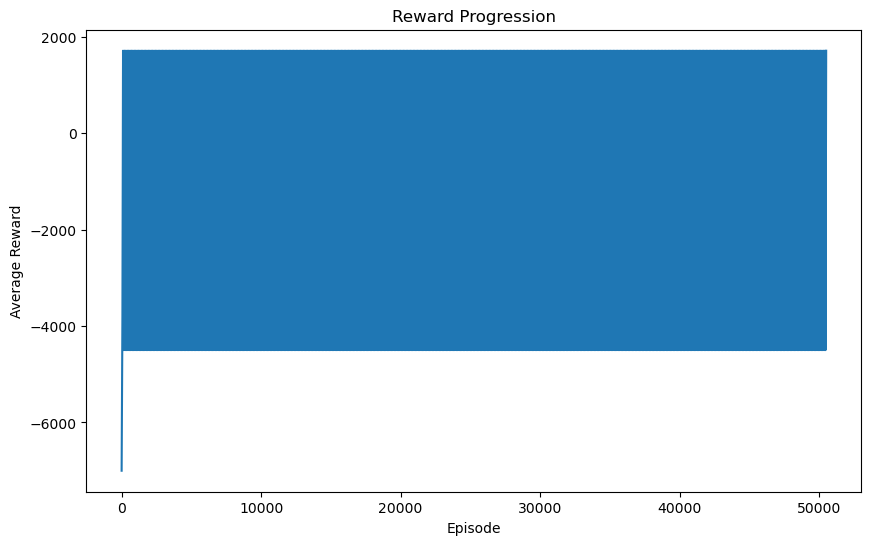

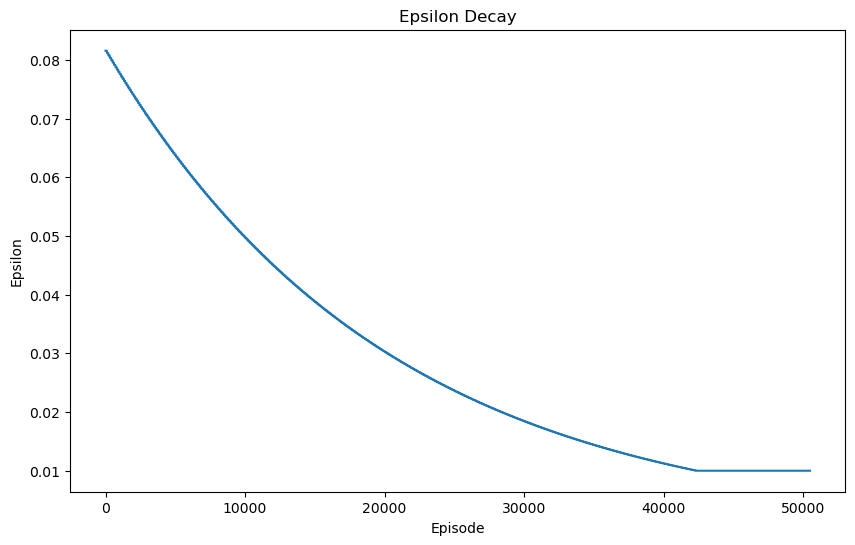

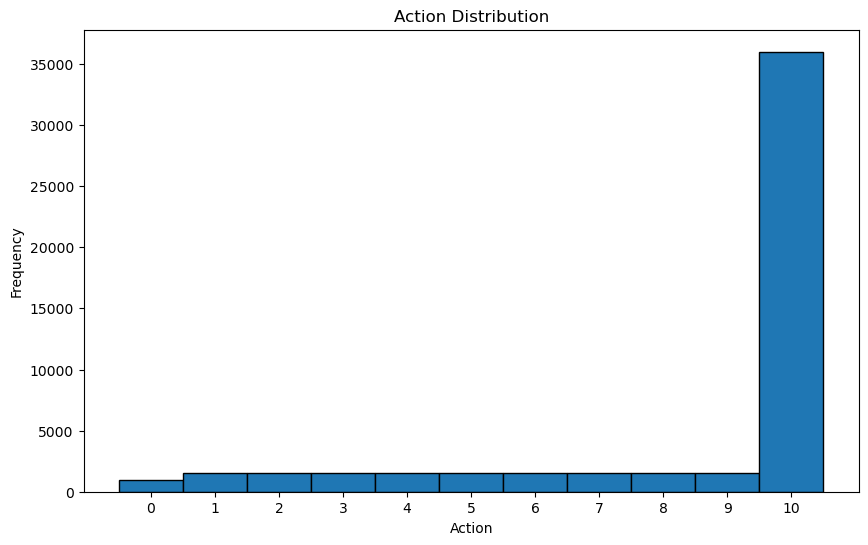

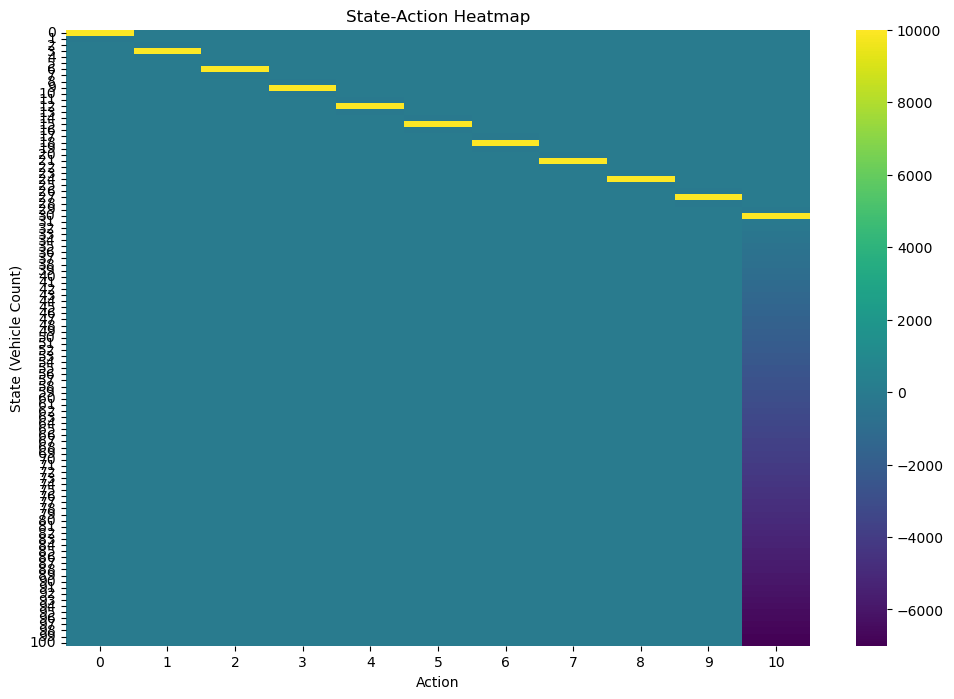

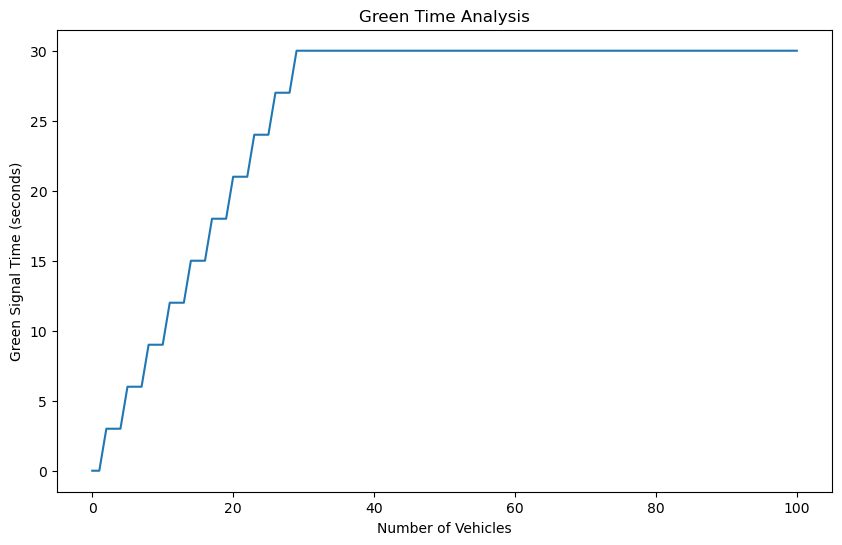

In [9]:
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns

class PerformanceTracker:
    def __init__(self):
        self.rewards = []
        self.epsilon_values = []
        self.actions = []
        self.state_action_rewards = {}

    def track(self, reward, epsilon, action, state, agent):
        self.rewards.append(reward)
        self.epsilon_values.append(epsilon)
        self.actions.append(action)
        
        if state not in self.state_action_rewards:
            self.state_action_rewards[state] = np.zeros(agent.action_size)
        self.state_action_rewards[state][action] = reward

    def plot_metrics(self):
        self.plot_reward_progression()
        self.plot_epsilon_decay()
        self.plot_action_distribution()
        self.plot_state_action_heatmap()

    def plot_reward_progression(self):
        avg_rewards = [np.mean(self.rewards[max(0, i-50):i+1]) for i in range(len(self.rewards))]
        plt.figure(figsize=(10, 6))
        plt.plot(avg_rewards)
        plt.title('Reward Progression')
        plt.xlabel('Episode')
        plt.ylabel('Average Reward')
        plt.show()

    def plot_epsilon_decay(self):
        plt.figure(figsize=(10, 6))
        plt.plot(self.epsilon_values)
        plt.title('Epsilon Decay')
        plt.xlabel('Episode')
        plt.ylabel('Epsilon')
        plt.show()

    def plot_action_distribution(self):
        plt.figure(figsize=(10, 6))
        plt.hist(self.actions, bins=np.arange(agent.action_size + 1) - 0.5, edgecolor='black')
        plt.title('Action Distribution')
        plt.xlabel('Action')
        plt.ylabel('Frequency')
        plt.xticks(range(agent.action_size))
        plt.show()

    def plot_state_action_heatmap(self):
        all_states = sorted(self.state_action_rewards.keys())
        all_actions = range(agent.action_size)
        heatmap_data = np.zeros((len(all_states), len(all_actions)))

        for i, state in enumerate(all_states):
            heatmap_data[i] = self.state_action_rewards[state]

        plt.figure(figsize=(12, 8))
        sns.heatmap(heatmap_data, xticklabels=all_actions, yticklabels=all_states, cmap='viridis')
        plt.title('State-Action Heatmap')
        plt.xlabel('Action')
        plt.ylabel('State (Vehicle Count)')
        plt.show()

    def plot_green_time_analysis(self, agent):
        vehicle_counts = range(agent.env.max_vehicles + 1)
        green_times = [agent.predict_green_signal(vc) for vc in vehicle_counts]

        plt.figure(figsize=(10, 6))
        plt.plot(vehicle_counts, green_times)
        plt.title('Green Time Analysis')
        plt.xlabel('Number of Vehicles')
        plt.ylabel('Green Signal Time (seconds)')
        plt.show()


tracker = PerformanceTracker()


def modified_train(agent, tracker, episodes):
    for e in range(episodes):
        for state_value in range(agent.env.max_vehicles, -1, -1):
            state = state_value
            best_action = agent.choose_action(state)
            reward = agent.env.step(best_action)
            state = np.reshape(state, [1, agent.state_size])
            agent.remember(state, best_action, reward)
            agent.best_actions[state_value] = best_action
            
            tracker.track(reward, agent.epsilon, best_action, state_value, agent)
            
            green_time = best_action * 3
            print(f"Episode {e+1}/{episodes}, State: {state_value}, Green Time: {green_time} seconds, Reward: {reward}")
            
        agent.update_target_model()
        agent.replay()
        print(f"Episode {e+1}/{episodes}, Epsilon: {agent.epsilon:.2}")


modified_train(agent, tracker, episodes)


tracker.plot_metrics()
tracker.plot_green_time_analysis(agent)
